# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and Tensorflow.Hub

## 1. Problem

Identifying the breed of dog given an image of a dog.

When I'm sitting at the cafe and I take picture of a dog, I want to know what breed of dog it is.

## 2. Data

The Data we're using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluaiton is a file with predictions probabilities for each dog breed of each test image.
www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:

* We're daling with images (unstructured data) so it's probably best we use deep/transfer learning.
* There are 120 breeds of dogs(this means there are 120 different classes).
* There are around 10,000+ images in the training set(these images have labels)
* There are around 10,000+ images in the test set(these images have no labels, because we'll want to predict them).

In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip '/content/drive/MyDrive/Dog Vision/dog breed identification.zip' -d 'drive/MyDrive/Dog Vision/'

# Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [1]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version", hub.__version__)

# Check for GPU availability
print('GPU', 'available(YEEEESSSS!!!)' if tf.config.list_physical_devices("GPU") else 'not available :(')

TF version: 2.15.0
TF Hub version 0.15.0
GPU available(YEEEESSSS!!!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors(numerical representations).
Let's start by accessing our data and checking out the labels.

In [2]:
# Checking out the labels our data
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

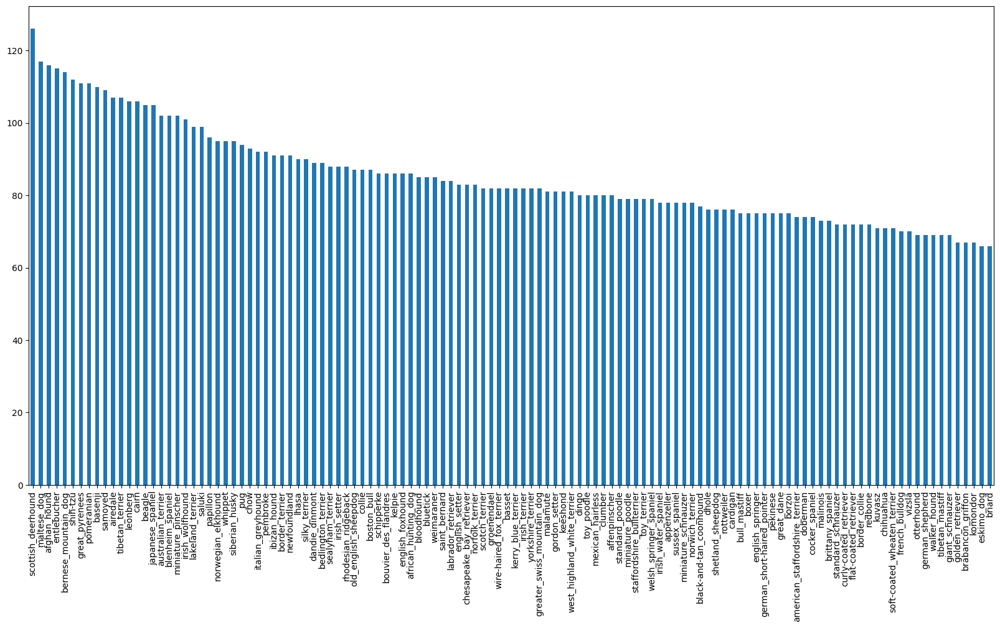

In [3]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize = (20, 10))

In [4]:
labels_csv['breed'].value_counts().mean()

85.18333333333334

In [5]:
# Let's view an image
from IPython.display import Image
#Image('/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

# Getting images and their labels

Let's get a list of all of our image file pathnames.

In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [7]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10 filenames
filenames[:10]

['/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-

In [8]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!


Since we've got our train image filepaths, in a list let's prepare our labels.

In [9]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [10]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames.')
else:
  print("Number of labels doesn't macth number of filenames, check data directories")

Number of labels matches number of filenames.


In [11]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [12]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [13]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [14]:
# Example: Turning boolean array into integers
print(labels[0]) # origional label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean arrays
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating our own validation set

Since the dataset form Kaggle doesn't come with validation set, we're going to create our own.

In [15]:
# Split X & y
X = filenames
y = boolean_labels

In [16]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: 'slider', min:1000, max:10000, step:1000}

In [17]:
# Let's split our data into training and validation sets
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                  y[:NUM_IMAGES],
                                  test_size=0.2,
                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

# Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use the TensorFlow to read the file and save it to a variable `image`.
3. Turn our `image` (a jpg) into tensors.
4. Resize to `image` to be a shape of (224, 224).
4. Return the modified `image`

In [18]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels(Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

# Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in on ego... they all might be not fit into memory.
So that's why we do about 32(this is a batch size) iamges at a time(you can manually adjust a batch if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this(`image, label`).

In [19]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [20]:
# Demo of the above
process_image(X[42], y[42])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

Now we've got a way to turn our data into tuples of Tensors in the form:(`image`, `label`). Let's make a function to turn all of our data (X & y) into batches!

In [21]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batchs of data out of image (X) and label (y) pairs.
  Shuffles a data if it's training data but doesn't shuffle if it's validation data.
  """
  # If a data is a test dataset, we probably don't have to have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y)))   # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # Shufflingg pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))

    # Create (image, label) tuples (this also turns the image path into preprocessed (image)
    data = data.map(get_image_label)

    # Turn training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [22]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [23]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data Batches

Our data is now in batches, however, thesse can be a little hard to undestand/comprehend, let's visusalize them.

In [24]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.

  """
  # Setup the figure
  plt.figure(figsize = (10, 10))
  # Loop for throuhg 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i + 1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as a title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn grid lines off
    # plt.axis('off')

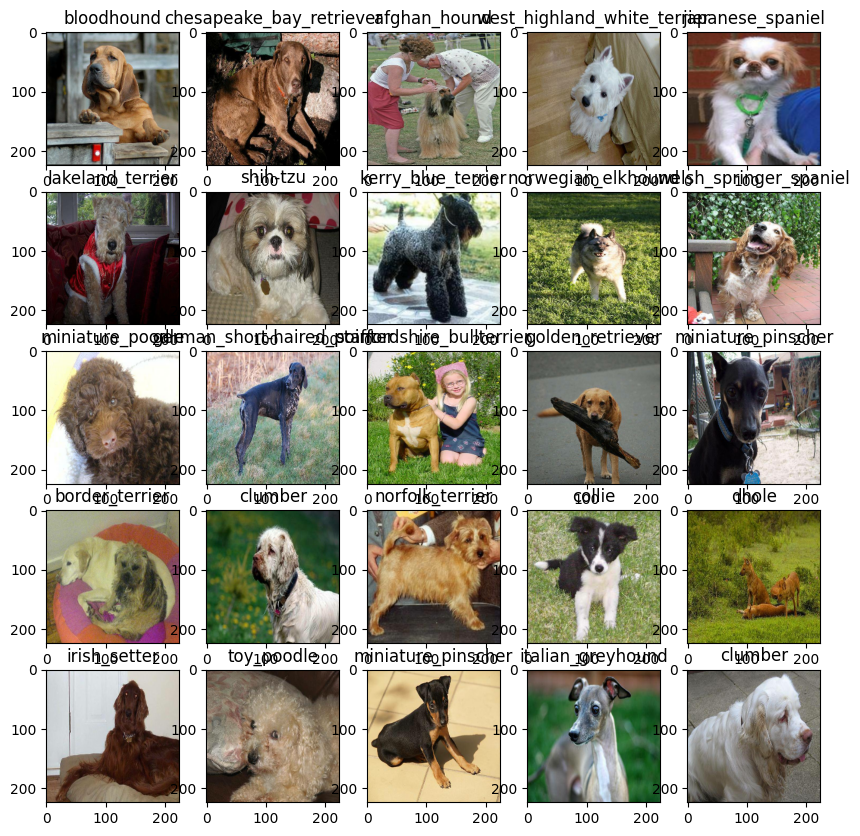

In [25]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

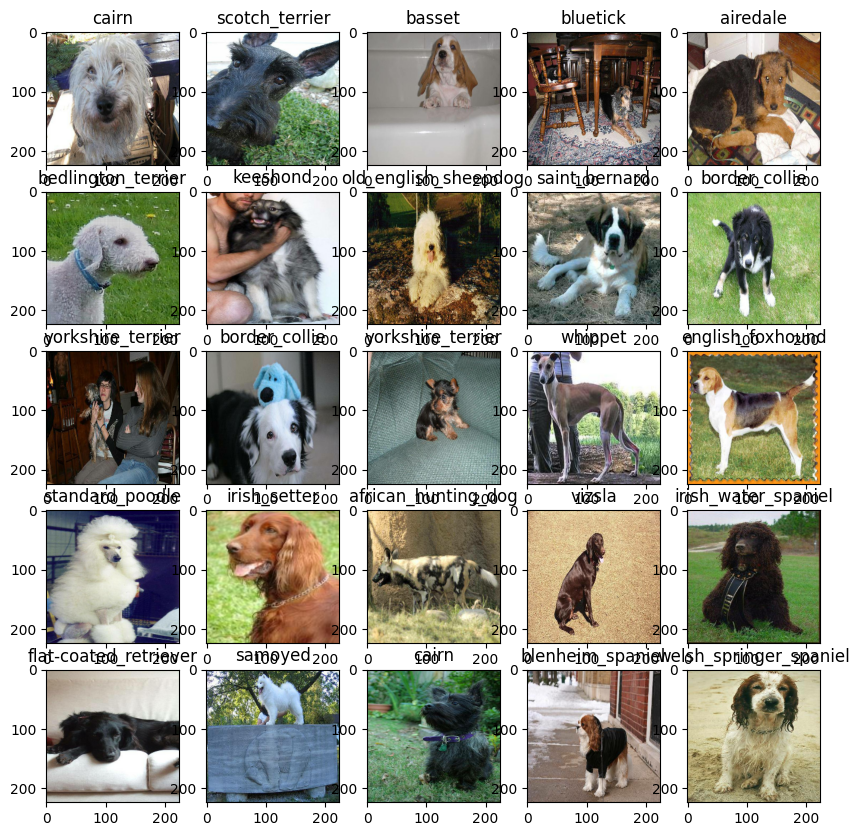

In [26]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

Before we build a model, there a few things we need to define:
* The input shape(our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the for of Tensors) of our model.
* The URL of the model we want to use.

In [27]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow HUB
MODEL_URL = 'https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true'

Now we've got our inputs, outputs and model reasy to go. Let's put them together into a Keras deep learning model!

Knowing this let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion(do this first, then this, then that).
* Compiles the model(says it should be evaluates and improved).
* Builds the model (tells the model the input shape it'll getting).
* Returns the model.

In [28]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):

  #Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = 'softmax') # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [29]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# Creating callbacks

Callbacks are helper functions a model you can use during training to do such things as save its progress, check its progress or stop training early if a model stps improving.

We'll create two callbacks, one for Tensorboars which helps track our models progress and and early stopping which prevents our model form training for too long.

# TensorBoard Callback

To setup a TensorBoard callback, we need to do things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass to our model's `fit()` function.
3. Visualize our models training logs with `%tensorboad` magis function (we'll do this after model training).

In [30]:
# Load TensorBoard notebook extension.
%load_ext tensorboard

In [31]:
import datetime

# Create a function to build a Tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Dog Vision/logs',
                       # Make it so the logs get tracked whenever we run an experiment
                       datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

# Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [32]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  patience = 3)

# Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [33]:
NUM_EPOCHS = 100 #@param {type: 'slider', min: 10, max: 100, step: 10}

In [34]:
# Check to make sure we're still running on a GPU
print("GPU", 'available (YESSSSS!!!!)' if tf.config.list_physical_devices('GPU') else 'not available:(')

GPU available (YESSSSS!!!!)


Let's create a  function which trains a model.
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for('NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [35]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  # Return the fitted model
  return model

In [36]:
# Fit the model to the data
model = train_model()

Epoch 1/100
25/25 [==============================] - 97s 4s/step - loss: 4.6220 - accuracy: 0.0975 - val_loss: 3.5458 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 5s 205ms/step - loss: 1.6660 - accuracy: 0.6737 - val_loss: 2.2874 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 5s 185ms/step - loss: 0.5583 - accuracy: 0.9475 - val_loss: 1.7994 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - 6s 246ms/step - loss: 0.2517 - accuracy: 0.9900 - val_loss: 1.5806 - val_accuracy: 0.5850
Epoch 5/100
25/25 [==============================] - 5s 187ms/step - loss: 0.1483 - accuracy: 0.9975 - val_loss: 1.4879 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 173ms/step - loss: 0.1016 - accuracy: 1.0000 - val_loss: 1.4453 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================] - 5s 211ms/step - loss: 0.0759 - accuracy: 1.0000 - val_loss: 1.4205 - val_accuracy: 0.6300
E

**Question:** It looks like our model is overfitting because it's performing far better on trainng dataset than the validation set, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with a good thing! It means our model is learning!

# Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [37]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

# Making and evaluating predictions using a trained model

In [38]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [39]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 15s 118ms/step


array([[9.7812340e-04, 1.6082519e-04, 2.1065900e-03, ..., 5.4206105e-04,
        1.7619692e-04, 2.3137864e-03],
       [7.5789227e-04, 7.4686372e-04, 1.3319817e-03, ..., 3.4920260e-04,
        2.7417447e-03, 1.2218213e-04],
       [2.2078316e-06, 1.9452584e-05, 2.2561562e-05, ..., 2.9074045e-05,
        4.6631487e-07, 5.3153912e-05],
       ...,
       [4.2596512e-06, 3.2666499e-05, 4.6606929e-05, ..., 9.7812108e-06,
        2.4928772e-03, 4.2572610e-05],
       [1.1058237e-03, 1.4070922e-04, 2.7722856e-05, ..., 4.6398629e-05,
        5.6845943e-06, 4.3618213e-03],
       [3.4850507e-04, 4.6693167e-05, 1.5567328e-03, ..., 2.6128339e-03,
        4.9359101e-04, 3.1733805e-05]], dtype=float32)

In [40]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[9.7812340e-04 1.6082519e-04 2.1065900e-03 1.8827293e-04 4.5305819e-04
 1.2422865e-04 3.3856045e-02 1.5964782e-03 3.3454382e-04 1.1529068e-03
 6.2060863e-04 9.6784861e-05 1.6004082e-03 1.3665993e-04 1.6727352e-04
 3.5862831e-04 7.1978097e-06 3.4965217e-01 2.8422804e-04 1.6273971e-04
 1.2110339e-03 1.6456848e-04 9.8164492e-06 1.3931460e-03 3.6290035e-05
 4.7733931e-05 8.6134024e-02 3.3143479e-05 3.6961422e-04 2.1990844e-04
 6.5309039e-05 2.4342726e-03 4.5535705e-04 1.0703825e-04 1.2549953e-04
 6.7369916e-02 1.5621550e-05 6.9371372e-04 2.4223391e-05 6.2088809e-05
 1.0483514e-03 5.1027338e-05 7.0303446e-05 3.2931185e-04 2.4314456e-04
 6.0889703e-05 4.0789881e-05 2.2837176e-04 7.8927353e-04 8.7623652e-05
 3.5021480e-05 1.0531980e-04 5.4012315e-04 3.4662324e-05 1.4749769e-04
 4.8514543e-05 3.5546723e-04 8.5352417e-03 3.9492082e-03 5.2755293e-02
 1.7322776e-04 8.4535486e-06 8.4600737e-03 4.2707208e-05 7.1878126e-04
 4.4433914e-02 4.0532229e-04 1.3719122e-04 1.7749725e-03 9.8197313e-05
 3.341

In [41]:
unique_breeds[26]

'cairn'

Have the above functionality is great but we want to be able to it at scale.

And it would even better if could see the image th eprediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [42]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

Since our validaiton data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [43]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of iamges and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [44]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

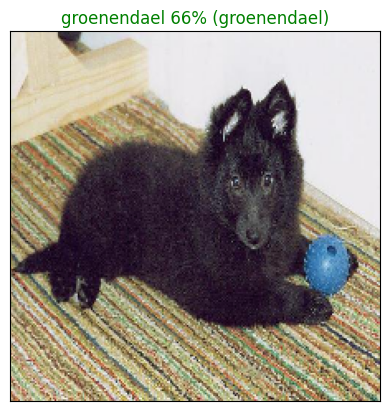

In [45]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities = predictions,
          labels=val_labels,
          images=val_images,
          n = 77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
** Prediction probabilities indexes
** Prediction probabilities values
** Prediction labels

* Plot the top 10 prediction probability values and labels, coloring the true label green


In [46]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  """
  Plus the top 10 highest prediction confidence along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = 'vertical')

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
      pass


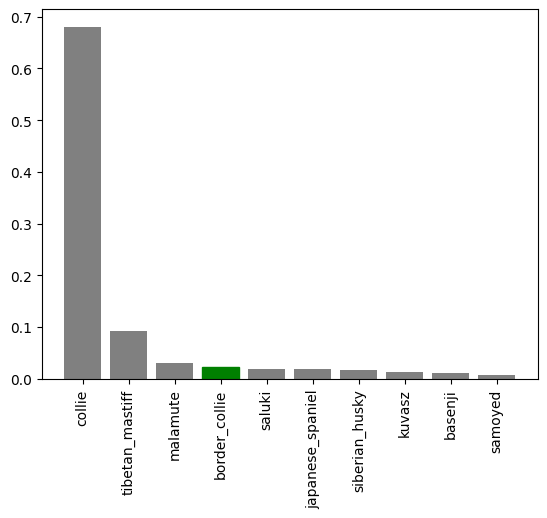

In [47]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

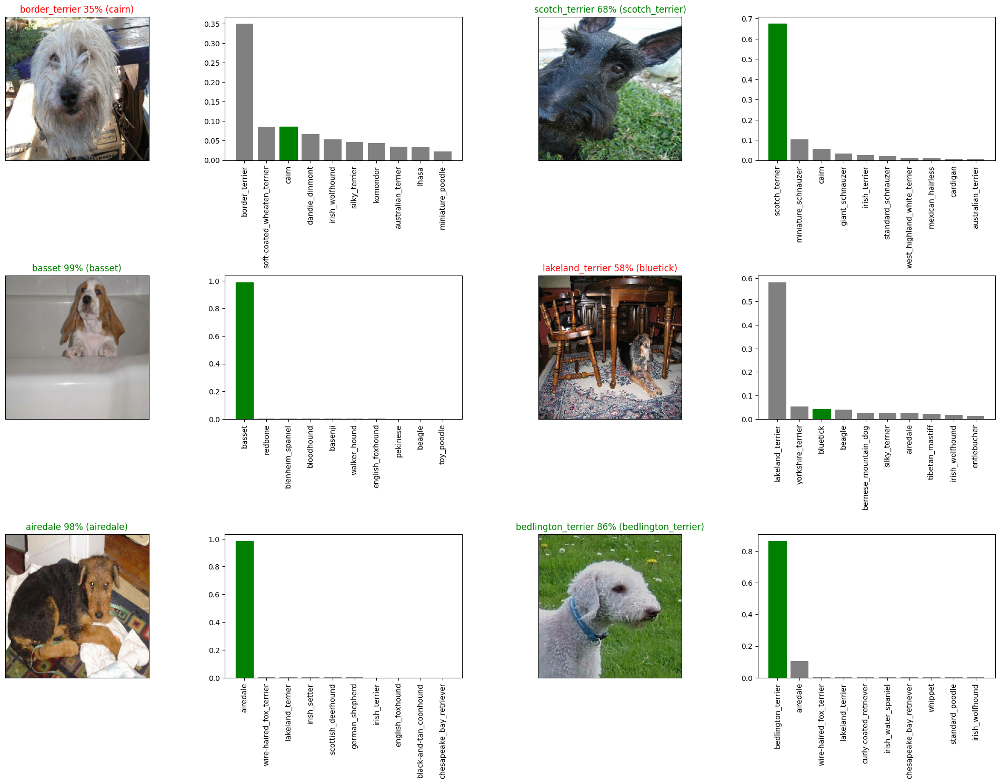

In [48]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n = i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

# Saving and reloading a trained model

In [49]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix(string).
  """
  # Create a models direcotry pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save a format of file
  print(f"Save a model to {model_path}...")
  model.save(model_path)
  return model_path

In [50]:
# Create a function to load a model
def load_model(model_path):
  """
  Loads a saved model from a specified way.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [51]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Save a model to drive/MyDrive/Dog Vision/models/20240119-07421705650155-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240119-07421705650155-1000-images-mobilenetv2-Adam.h5'

In [52]:
# Load a trained model
load_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20240117-05191705468797-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20240117-05191705468797-1000-images-mobilenetv2-Adam.h5


In [53]:
# Evaluate pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 106ms/step - loss: 1.2933 - accuracy: 0.6600


[1.293328881263733, 0.6600000262260437]

In [54]:
# Evaluate the loaded model
load_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 114ms/step - loss: 1.3083 - accuracy: 0.6800


[1.3083157539367676, 0.6800000071525574]

# Training a big dog model (on the full data)

In [55]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [56]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [57]:
# Create a model for full model
full_model = create_model()

In [58]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy',
                                                             patience = 3)

**Note:** Running the cell below will take a little while(maybe up to 30 minutes for the first epoch) becase the GPU we're using in the runtime has to load all of the images into memory)

In [59]:
# Fit the full model to the full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 874s 3s/step - loss: 1.3391 - accuracy: 0.6692
Epoch 2/100
320/320 [==============================] - 48s 149ms/step - loss: 0.4011 - accuracy: 0.8830
Epoch 3/100
320/320 [==============================] - 47s 148ms/step - loss: 0.2377 - accuracy: 0.9348
Epoch 4/100
320/320 [==============================] - 51s 158ms/step - loss: 0.1556 - accuracy: 0.9628
Epoch 5/100
320/320 [==============================] - 47s 147ms/step - loss: 0.1066 - accuracy: 0.9778
Epoch 6/100
320/320 [==============================] - 48s 151ms/step - loss: 0.0774 - accuracy: 0.9865
Epoch 7/100
320/320 [==============================] - 48s 150ms/step - loss: 0.0581 - accuracy: 0.9916
Epoch 8/100
320/320 [==============================] - 53s 165ms/step - loss: 0.0468 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 48s 149ms/step - loss: 0.0378 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 49s 154ms/

In [60]:
save_model(full_model, suffix = 'full-image-set-mobilenetv2-Adam')

Save a model to drive/MyDrive/Dog Vision/models/20240119-08171705652259-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20240119-08171705652259-full-image-set-mobilenetv2-Adam.h5'

In [61]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20240117-06111705471861-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20240117-06111705471861-full-image-set-mobilenetv2-Adam.h5


# Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches` earlier which can take a list of filenames as input and converet them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test images filenames.
* Convert images into test data batches using `create_data_batches()` and setting the `test_daata` parameter to `True` (since the test data doesn't have. labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [62]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e1deaf47925c840d804d7ff0324ee1fe.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e302e1c88252f91357e62b8fd340f2d1.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e2c3376aeea1057337f02dfc48feee62.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e0e47873420b2ed420e920a74c663233.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e2d65ef41ec9a649c8dbd92f0b821163.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e2b4d6b6590fa2941e74238248093eb3.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/dcab2d03a686ab3f31d1bc3e5700f6d1.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identific

In [63]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [64]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model passing it the test data batch will take a long time to run (~about 1 hour). This is because we have to process ~10.000+ images and get our model to fin d patterns in those images and generate predictions based on what its learned in the training dataset.  

In [65]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 345s 1s/step


In [66]:
# Save predictions (NumPy array) to csc file (for access later)
np.savetxt('drive/MyDrive/Dog Vision/preds_array.csv', test_predictions, delimiter = ',')

In [67]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/Dog Vision/preds_array.csv', delimiter = ',')

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our model prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

To get the data in this format, we'll:
* Create a pandas DataFrame with a n ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the predictions probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [68]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns = ['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [69]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [82]:
# Add prediction probabilities to each dog breed columns
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1deaf47925c840d804d7ff0324ee1fe,1.754297e-06,4.416731e-05,4.035931e-10,6.594813e-11,1.750542e-07,1.344841e-07,1.084646e-08,4.567028e-08,1.286193e-09,...,1.140917e-06,5.856953e-10,1.236238e-09,2.510049e-08,8.550081e-10,5.813772e-09,4.231848e-09,4.233438e-06,1.107539e-10,9.889720e-11
1,e302e1c88252f91357e62b8fd340f2d1,6.809807e-06,8.620472e-08,2.271067e-10,3.756691e-09,3.332877e-08,2.546261e-10,1.616286e-07,2.754838e-08,3.610851e-10,...,1.277200e-06,3.309331e-08,5.931188e-09,1.310406e-08,3.277865e-08,5.703250e-09,7.101320e-08,4.925435e-13,2.081289e-08,1.237272e-07
2,e7e9624f2a2e61ab187358f5968bfde8,6.558498e-09,6.883578e-11,1.078236e-09,8.546315e-12,2.748332e-08,1.421612e-08,5.524602e-12,8.688031e-10,5.892562e-09,...,5.475745e-09,2.530225e-09,1.200561e-08,6.190340e-09,1.753865e-10,2.372114e-07,1.118049e-09,2.141005e-10,8.747842e-10,3.395727e-10
3,e2c3376aeea1057337f02dfc48feee62,3.800266e-07,8.356229e-11,1.994751e-08,4.339880e-10,1.693196e-06,6.691881e-10,5.394545e-03,1.021010e-08,2.640039e-06,...,1.529495e-06,2.112676e-08,1.530780e-08,1.280437e-09,2.302475e-08,8.210488e-10,4.585792e-04,7.027081e-09,1.109890e-07,1.429055e-09
4,e7b608110b0e29120d8740f37e85f3d0,2.101003e-08,3.840138e-13,6.320148e-12,1.932573e-11,1.058020e-10,1.581134e-11,4.537131e-12,4.945449e-11,2.219117e-13,...,1.323541e-11,9.281120e-11,1.592043e-11,1.021422e-09,3.777040e-10,9.321743e-12,5.094761e-11,1.984079e-11,1.423887e-11,5.601045e-10


In [83]:
# Save our predictions DataFrame to CSV for submission to Kaggle
preds_df.to_csv('drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv',
                index = False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom iamge data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [108]:
# Get custom image filepaths
custom_path = '/content/drive/MyDrive/Dog Vision/my-dog-photos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [109]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [110]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 156ms/step


In [111]:
# Get custom image predictions labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['appenzeller', 'golden_retriever']

In [112]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

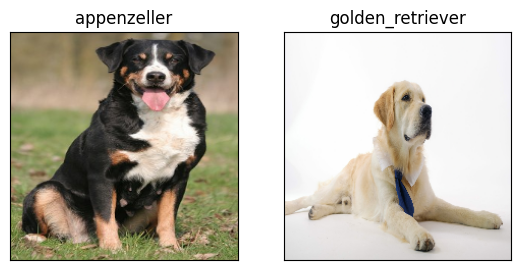

In [113]:
# Check custom image predictions
plt.figure(figsize = (10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i + 1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)